In [ ]:
%pip install --quiet --upgrade diffusers transformers accelerate invisible_watermark mediapy moviepy gtts
!apt-get install -y imagemagick
!sed -i 's/rights="none"/rights="read|write"/' /etc/ImageMagick-6/policy.xml
%pip install transformers

import mediapy as media
import random
import sys
import torch
import re
import os
import json

from diffusers import DiffusionPipeline
from moviepy.editor import ImageClip, TextClip, CompositeVideoClip, concatenate_videoclips, AudioFileClip
from gtts import gTTS
from moviepy.config import change_settings
from IPython.display import IFrame
from google.colab import files
from transformers import pipeline


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
imagemagick is already the newest version (8:6.9.11.60+dfsg-1.3ubuntu0.22.04.5).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


# Summarize the Text

In [ ]:
# Load the summarization pipeline
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

# Read news text from input JSON file
input_file = '/content/input.json'
with open(input_file, 'r') as f:
    data = json.load(f)

# If data is a single long text, split it by sentence or paragraph.
if isinstance(data, list) and data:
    text = data[0]
    news_items = text.split('.')  # Use appropriate delimiters like '. ' for sentence-based splitting
    summaries = []

    for i, news_text in enumerate(news_items):
        if news_text.strip():  # Skip empty strings
            summary = summarizer(news_text.strip(), max_length=30, min_length=5, do_sample=False)
            summary_text = summary[0]['summary_text']
            summaries.append(summary_text)
            print("Summary:", summary_text)

    # Exclude the last summary from the combined news only if there are more than 1 summary
    if len(summaries) > 1:
        news = ' '.join(summaries[:-1])  # Combine all summaries except the last one
    else:
        news = ' '.join(summaries)  # If there's only one summary, use it

The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


Summary: Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games. United had interim manager Ruud
Summary: Moises Caicedo's blistering second-half strike cancelled out a penalty from Bruno Fernandes. Chelsea salvaged a 1-
Summary: Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games. United had interim manager Ruud


Your max_length is set to 30, but your input_length is only 26. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=13)


Summary: Manchester United captain Fernandes scored from the spot in the 70th minute. Chelsea goalkeeper Robert Sanchez caught Rasmus Hojlund's foot
Summary: Fernandes sent Sanchez the wrong way, prompting Van Nistelrooy to leap in the air in celebration. Fernandes sent


Your max_length is set to 30, but your input_length is only 19. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=9)


Summary: Caicedo fired home a low volley that Andre Onana managed to just get a hand on. But the mood in Old Trafford swiftly


Your max_length is set to 30, but your input_length is only 22. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=11)


Summary: Ten Hag was sacked on Monday with United languishing in 14th in the Premier League.


Your max_length is set to 30, but your input_length is only 3. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=1)


Summary: Ruben Amorim was named as his replacement on Friday. He will arrive at the club on Nov 14.
Summary: CNN.com will feature iReporter photos in a weekly Travel Snapshots gallery. Visit CNN.com/Travel each week for a


In [ ]:
news

"Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games. United had interim manager Ruud Moises Caicedo's blistering second-half strike cancelled out a penalty from Bruno Fernandes. Chelsea salvaged a 1- Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games. United had interim manager Ruud Manchester United captain Fernandes scored from the spot in the 70th minute. Chelsea goalkeeper Robert Sanchez caught Rasmus Hojlund's foot Fernandes sent Sanchez the wrong way, prompting Van Nistelrooy to leap in the air in celebration. Fernandes sent Caicedo fired home a low volley that Andre Onana managed to just get a hand on. But the mood in Old Trafford swiftly Ten Hag was sacked on Monday with United languishing in 14th in the Premier League. Ruben Amorim was named as his replacement on Friday. He will arrive at the club on Nov 14."

# Gen image

In [ ]:
# Load models for generating images
use_refiner = False

pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
    ).to("cuda")

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.fp16.safetensors:  76%|#######5  | 1.05G/1.39G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:  20%|#9        | 1.02G/5.14G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
if use_refiner:
  refiner = DiffusionPipeline.from_pretrained(
      "stabilityai/stable-diffusion-xl-refiner-1.0",
      text_encoder_2=pipe.text_encoder_2,
      vae=pipe.vae,
      torch_dtype=torch.float16,
      use_safetensors=True,
      variant="fp16",
  )

  refiner = refiner.to("cuda")

  pipe.enable_model_cpu_offload()
else:
  pipe = pipe.to("cuda")

In [ ]:
# Function to split text into chunks of two sentences
def split_into_prompts(text, num_sentences=2):
    sentences = re.split(r'(?<=[.!?]) +', text)
    return [' '.join(sentences[i:i+num_sentences]) for i in range(0, len(sentences), num_sentences)]

In [ ]:
def prompt_image(prompt, output_path, pipe, use_refiner=False):
    try:
        seed = random.randint(0, sys.maxsize)
        images = pipe(
            prompt=prompt,
            output_type="latent" if use_refiner else "pil",
            generator=torch.Generator("cuda").manual_seed(seed),
        ).images

        if use_refiner:
            images = refiner(prompt=prompt, image=images).images

        print(f"Prompt:\t{prompt}\nSeed:\t{seed}")
        media.show_images(images)
        images[0].save(output_path)
        print('Image saved successfully.')
    except Exception as e:
        print(f"Error generating image: {e}")


In [ ]:
# Define the folder to save images
image_folder = "images"
os.makedirs(image_folder, exist_ok=True)  # Create the folder if it doesn't already exist


Generating image for prompt chunk 1: Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games.
Seed:	5671855116549067598


""

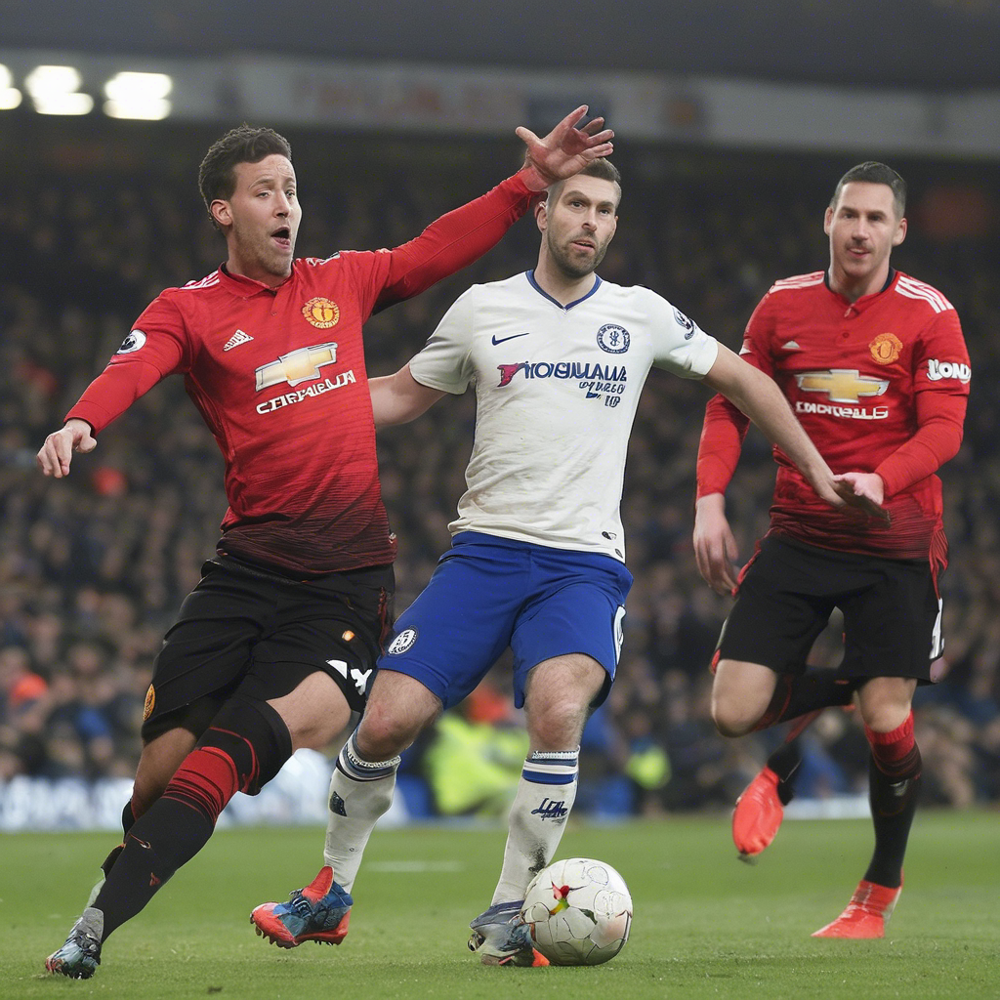

Image saved successfully.
Generating image for prompt chunk 2: United had interim manager Ruud Moises Caicedo's blistering second-half strike cancelled out a penalty from Bruno Fernandes.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	United had interim manager Ruud Moises Caicedo's blistering second-half strike cancelled out a penalty from Bruno Fernandes.
Seed:	8787693531456028118


""

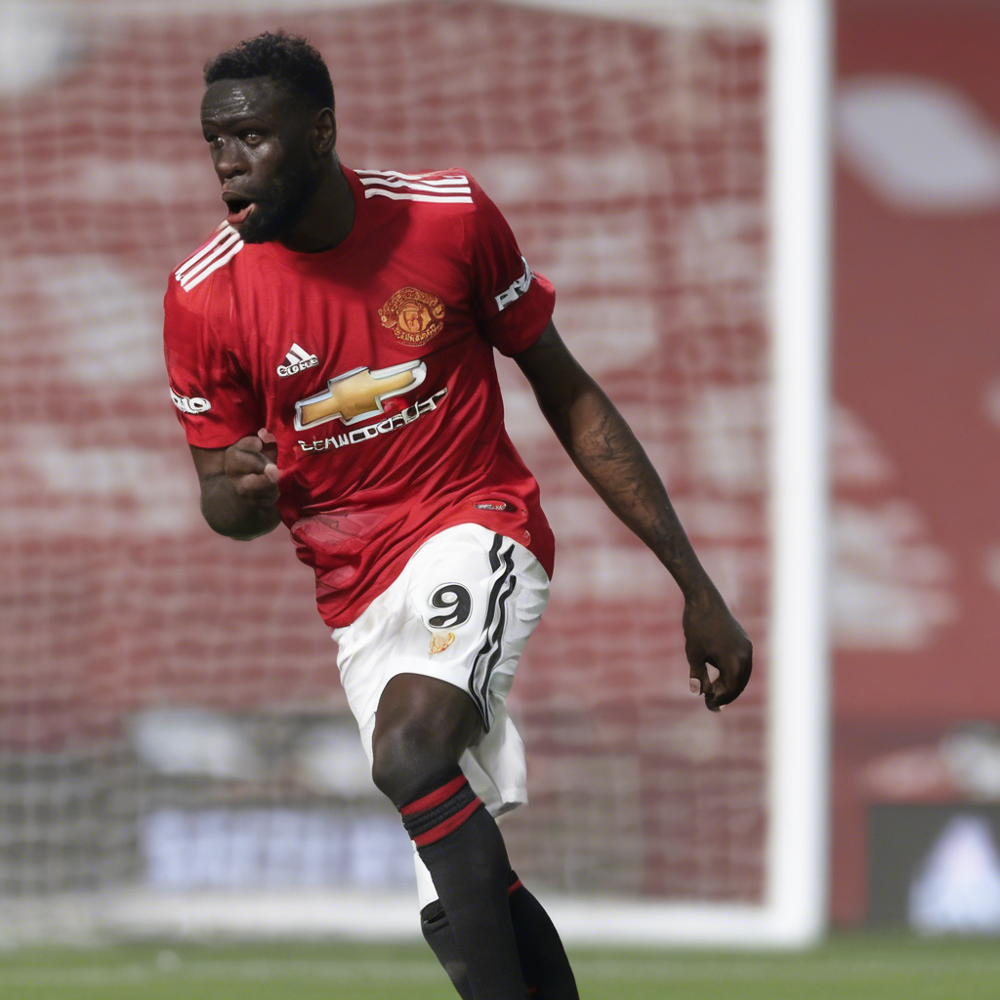

Image saved successfully.
Generating image for prompt chunk 3: Chelsea salvaged a 1- Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	Chelsea salvaged a 1- Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games.
Seed:	3035585757308578030


""

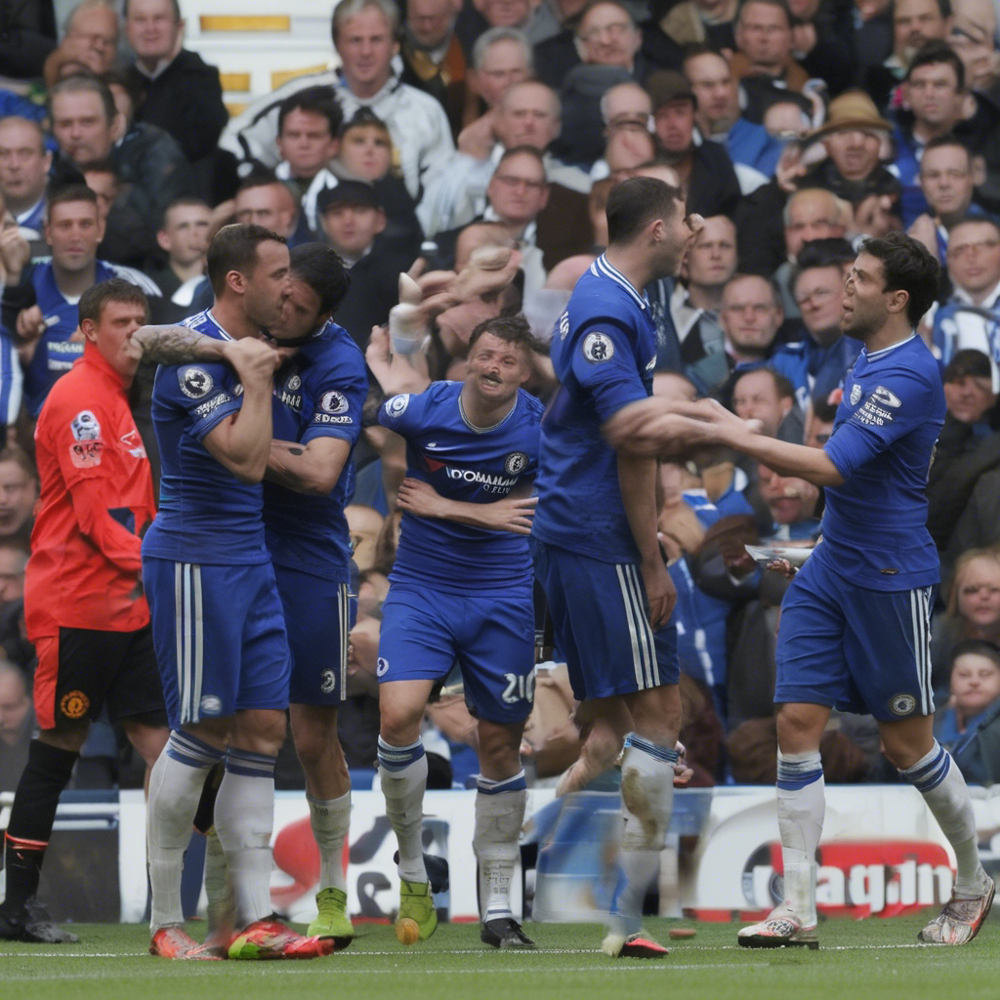

Image saved successfully.
Generating image for prompt chunk 4: United had interim manager Ruud Manchester United captain Fernandes scored from the spot in the 70th minute.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	United had interim manager Ruud Manchester United captain Fernandes scored from the spot in the 70th minute.
Seed:	5793911940562270119


""

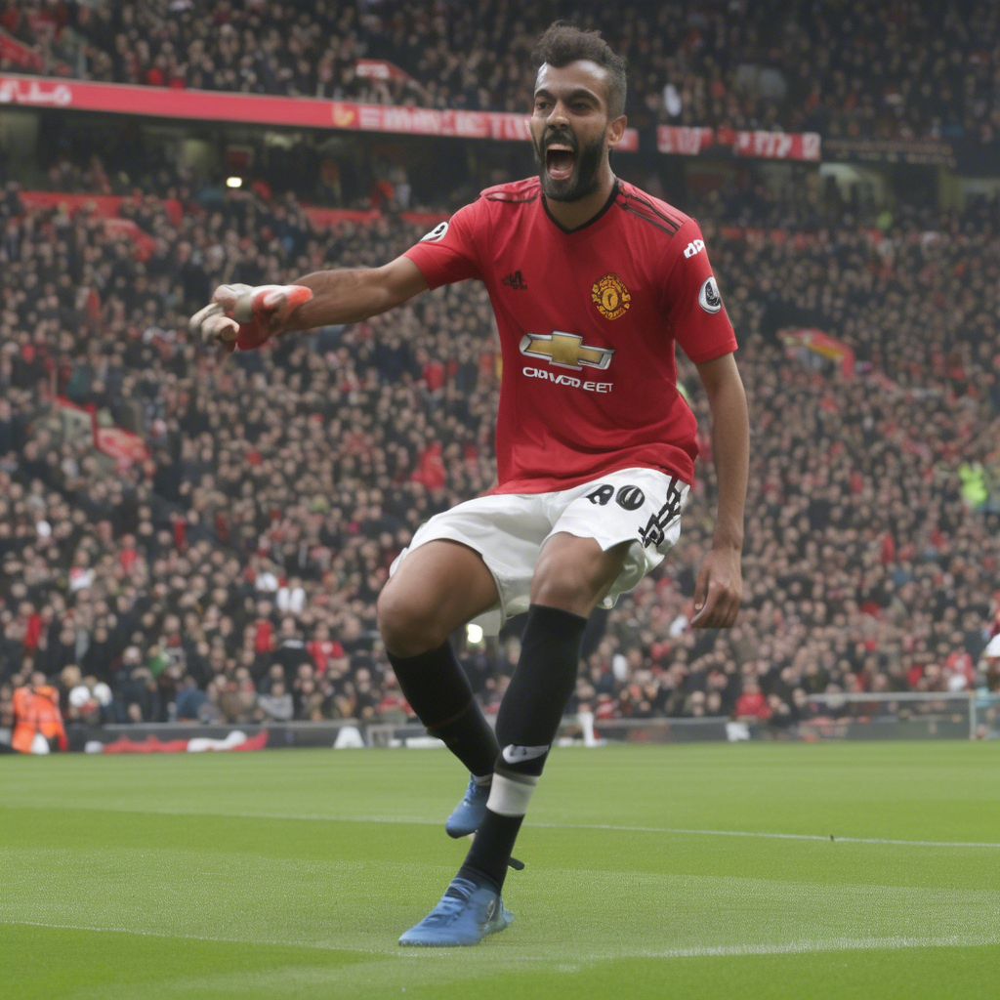

Image saved successfully.
Generating image for prompt chunk 5: Chelsea goalkeeper Robert Sanchez caught Rasmus Hojlund's foot Fernandes sent Sanchez the wrong way, prompting Van Nistelrooy to leap in the air in celebration.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	Chelsea goalkeeper Robert Sanchez caught Rasmus Hojlund's foot Fernandes sent Sanchez the wrong way, prompting Van Nistelrooy to leap in the air in celebration.
Seed:	8505837264974588990


""

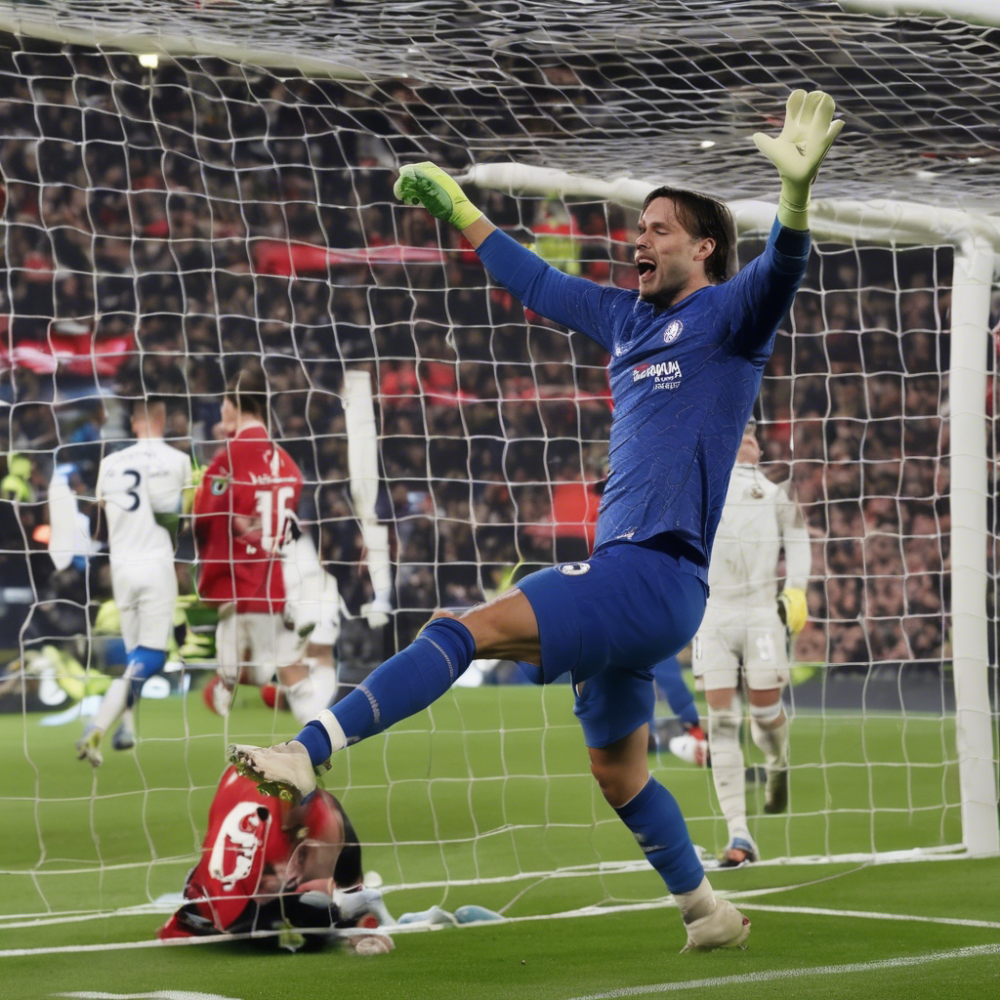

Image saved successfully.
Generating image for prompt chunk 6: Fernandes sent Caicedo fired home a low volley that Andre Onana managed to just get a hand on.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	Fernandes sent Caicedo fired home a low volley that Andre Onana managed to just get a hand on.
Seed:	2252130794101097153


""

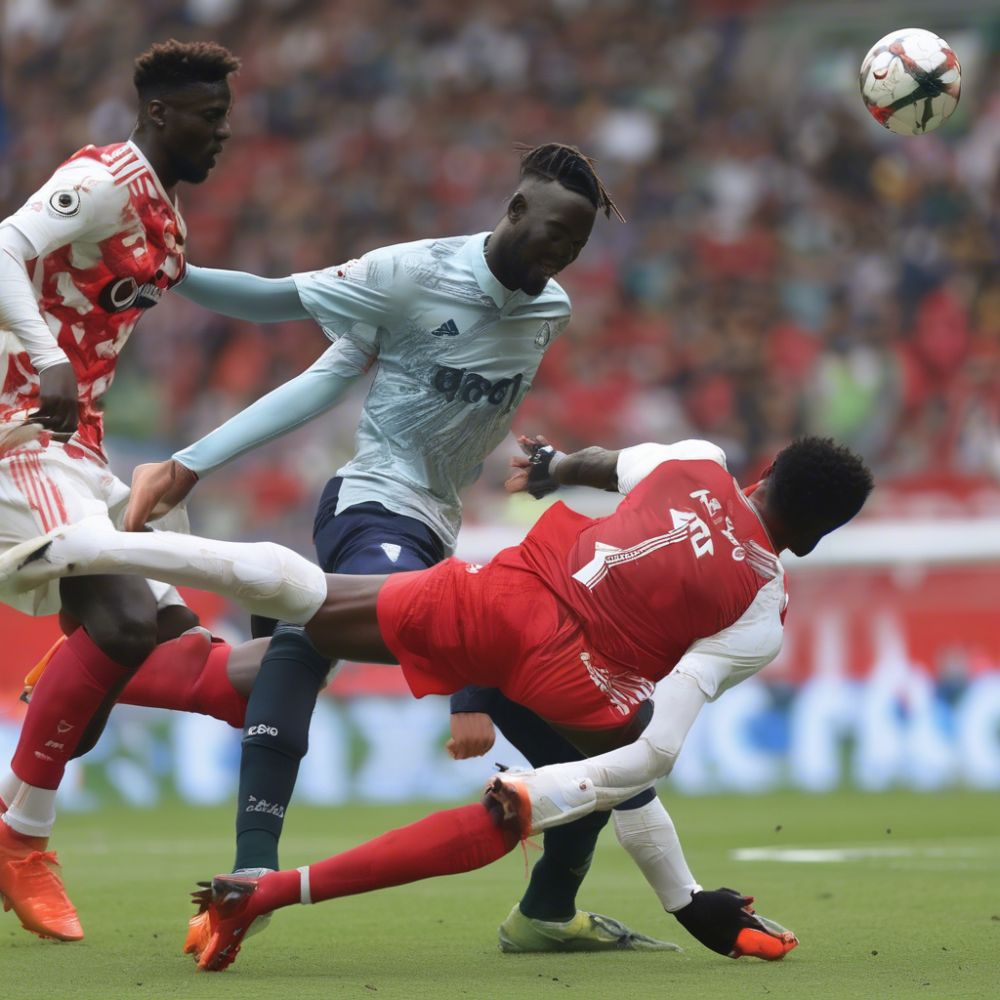

Image saved successfully.
Generating image for prompt chunk 7: But the mood in Old Trafford swiftly Ten Hag was sacked on Monday with United languishing in 14th in the Premier League.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	But the mood in Old Trafford swiftly Ten Hag was sacked on Monday with United languishing in 14th in the Premier League.
Seed:	4851074970961638854


""

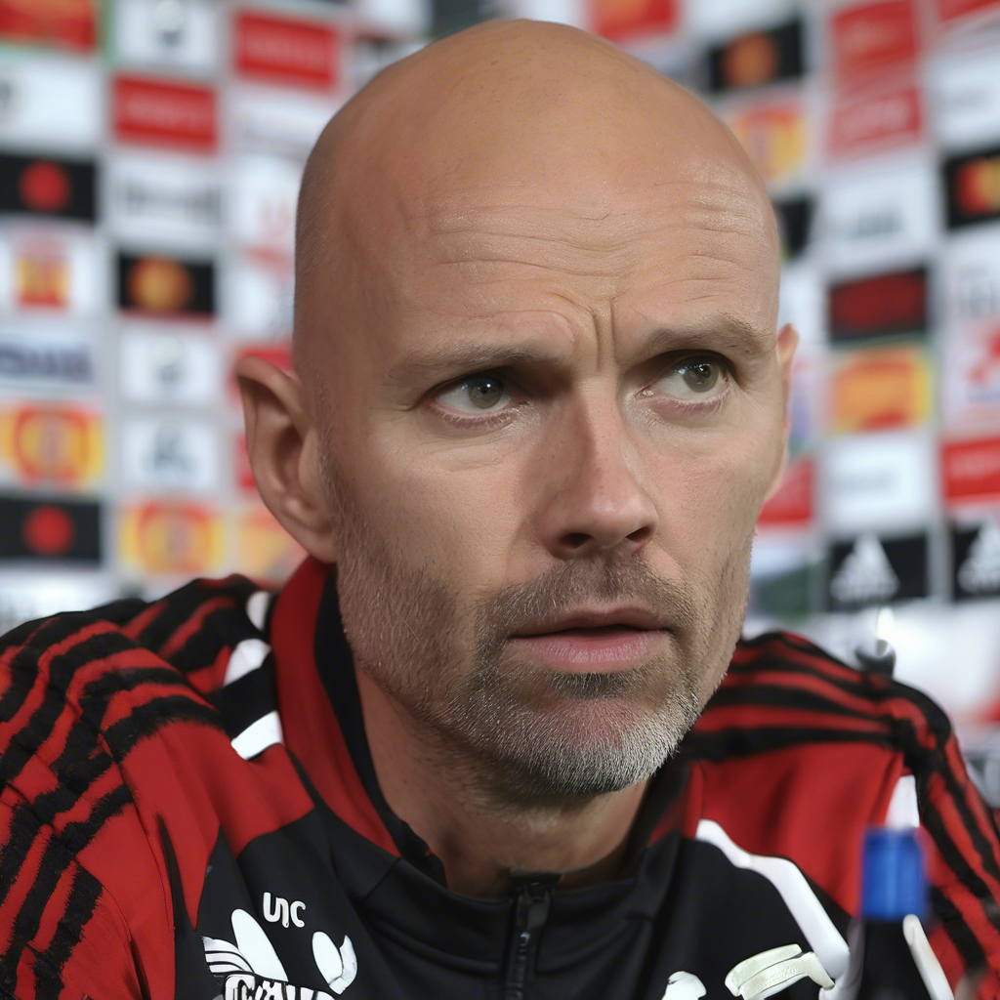

Image saved successfully.
Generating image for prompt chunk 8: Ruben Amorim was named as his replacement on Friday.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	Ruben Amorim was named as his replacement on Friday.
Seed:	3676993266350224162


""

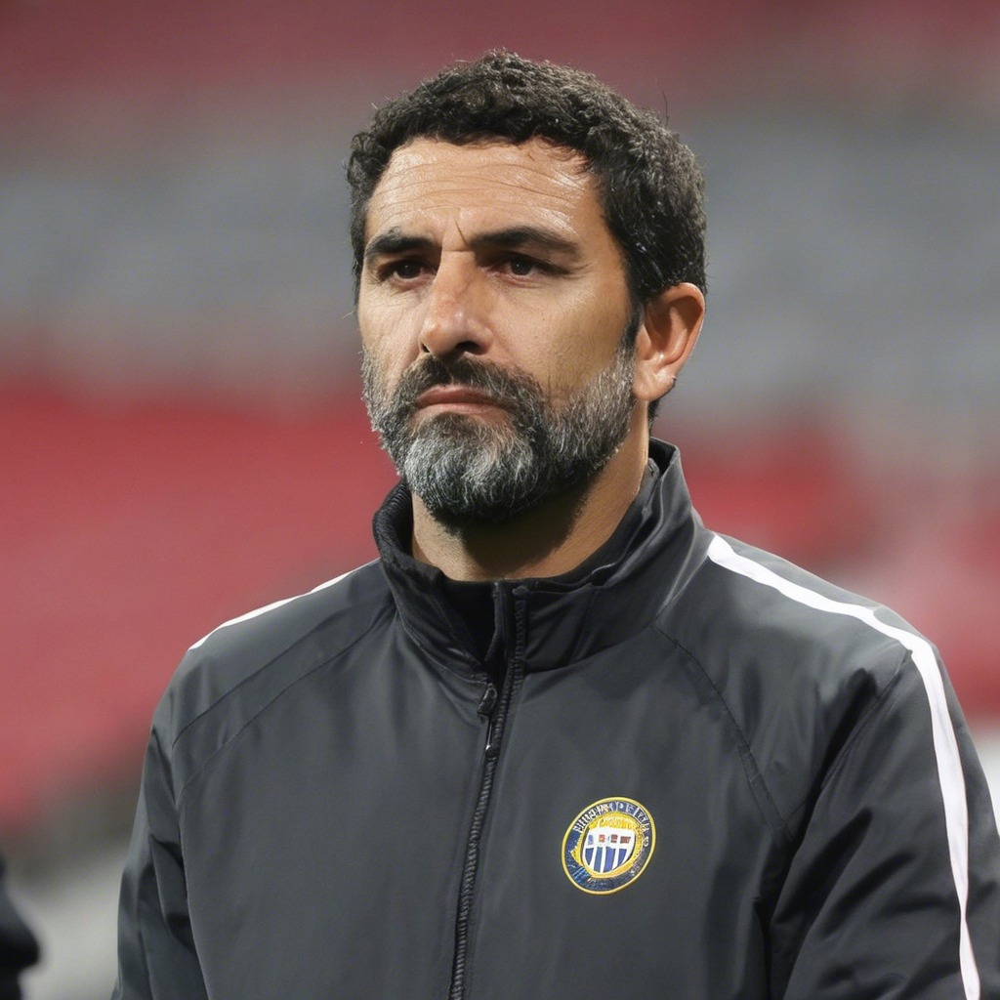

Image saved successfully.
Generating image for prompt chunk 9: He will arrive at the club on Nov 14.


  0%|          | 0/50 [00:00<?, ?it/s]

Prompt:	He will arrive at the club on Nov 14.
Seed:	5437827238571165838


""

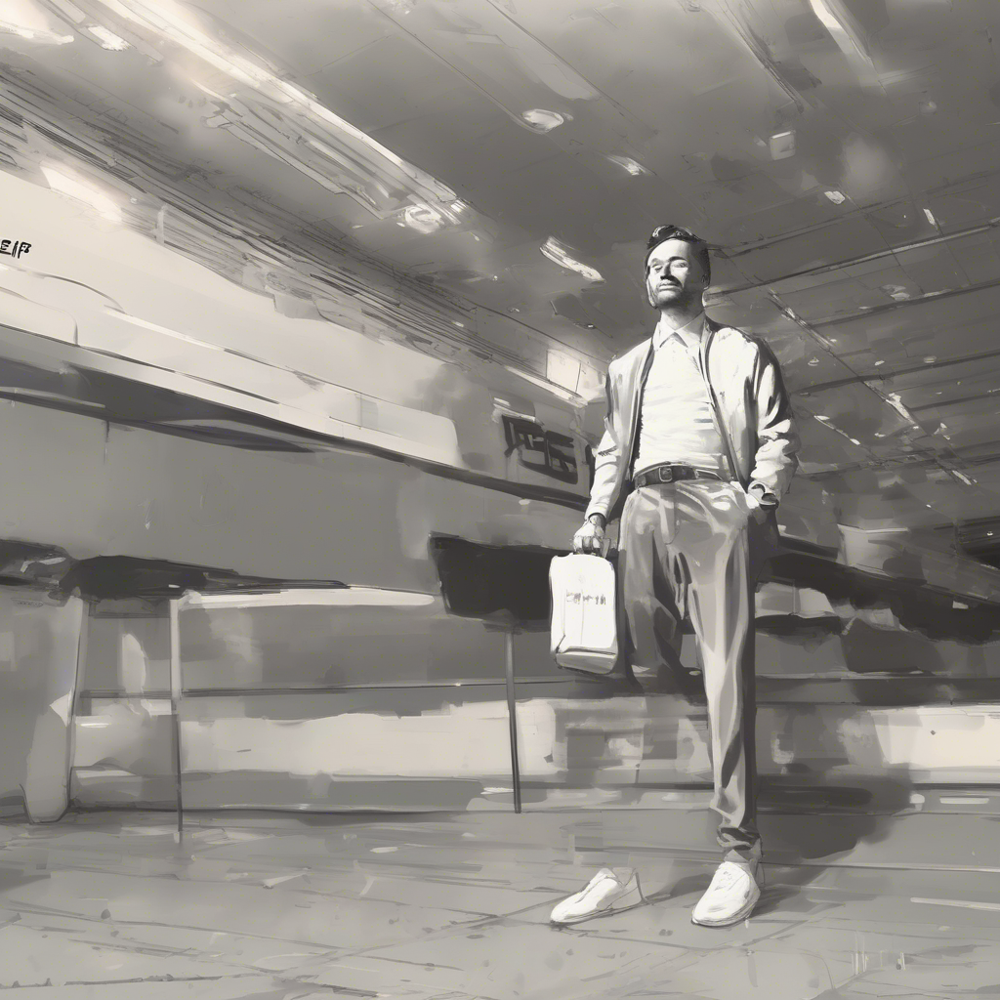

Image saved successfully.


In [ ]:
# Split the prompt text into one-sentence chunks
prompts = split_into_prompts(news, num_sentences=1)

images = []

# Ensure that 'pipe' and 'use_refiner' are defined and available in your environment
# For example:
# pipe = <your_image_pipeline>
# use_refiner = <True or False based on whether you want to use the refiner>

# Process each one-sentence chunk and generate an image
for i, chunk in enumerate(prompts):
    print(f"Generating image for prompt chunk {i+1}: {chunk}")

    # Define the output path to save the image in the 'images' folder
    output_path = os.path.join(image_folder, f"output_{i+1}.jpg")

    # Generate the image for each prompt chunk with 'pipe' and 'use_refiner' passed explicitly
    prompt_image(chunk, output_path, pipe, use_refiner)

    images.append(output_path)

#print("Images generated and saved in 'images' folder:", images)


In [ ]:
prompts

['Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games.',
 "United had interim manager Ruud Moises Caicedo's blistering second-half strike cancelled out a penalty from Bruno Fernandes.",
 'Chelsea salvaged a 1- Chelsea are fourth in the table on 18 points while United are 13th on 12 points after 10 games.',
 'United had interim manager Ruud Manchester United captain Fernandes scored from the spot in the 70th minute.',
 "Chelsea goalkeeper Robert Sanchez caught Rasmus Hojlund's foot Fernandes sent Sanchez the wrong way, prompting Van Nistelrooy to leap in the air in celebration.",
 'Fernandes sent Caicedo fired home a low volley that Andre Onana managed to just get a hand on.',
 'But the mood in Old Trafford swiftly Ten Hag was sacked on Monday with United languishing in 14th in the Premier League.',
 'Ruben Amorim was named as his replacement on Friday.',
 'He will arrive at the club on Nov 14.']

In [28]:
images

['images/output_1.jpg',
 'images/output_2.jpg',
 'images/output_3.jpg',
 'images/output_4.jpg',
 'images/output_5.jpg',
 'images/output_6.jpg',
 'images/output_7.jpg',
 'images/output_8.jpg',
 'images/output_9.jpg']

# Video

In [29]:
# Folder to save audio files
audio_folder = "audio_clips"
os.makedirs(audio_folder, exist_ok=True)

# List to store video clips
clips = []

In [30]:
# Define constants for font size, scrolling speed, and fixed image size
fixed_font_size = 40  # Set the fixed font size
scrolling_speed = 250  # Increase scrolling speed to 250 pixels per second
fixed_image_size = (1024, 1024)  # Set a fixed image size (width, height)

# Generate video clips with TTS and scrolling text overlay
clips = []  # Ensure clips list is initialized
for i, (prompt, image_path) in enumerate(zip(prompts, images)):
    # Generate Text-to-Speech audio
    tts = gTTS(text=prompt, lang='en')
    audio_path = f"{audio_folder}/audio_{i+1}.mp3"
    tts.save(audio_path)

    # Load the audio file to get its duration
    audio_clip = AudioFileClip(audio_path)
    audio_duration = audio_clip.duration + 3  # Set image duration to audio duration + 3 seconds

    # Load the image and resize it to the fixed size
    image_clip = ImageClip(image_path).resize(fixed_image_size)

    # Create a text clip with the fixed font size
    text_clip = TextClip(prompt, fontsize=fixed_font_size, color='white', size=(image_clip.w * 2, None))  # Text twice as wide as the image
    text_width = text_clip.size[0]

    # Calculate scrolling duration based on text width and scrolling speed
    scrolling_duration = text_width / scrolling_speed  # Time needed to scroll fully

    # Set the final duration to be the max of audio duration and scrolling duration
    duration = max(audio_duration, scrolling_duration)
    image_clip = image_clip.set_duration(duration)
    text_clip = text_clip.set_position(lambda t: (image_clip.w - int(t * scrolling_speed), image_clip.h - 50)).set_duration(duration)

    # Combine image and scrolling text
    video_clip = CompositeVideoClip([image_clip, text_clip])

    # Set audio to the clip
    video_clip = video_clip.set_audio(audio_clip)

    # Append to clips list
    clips.append(video_clip)

# Concatenate all clips into a final video
final_video = concatenate_videoclips(clips, method="compose")

# Export final video
final_video_path = "final_news_video_v1.mp4"
final_video.write_videofile(final_video_path, fps=24)

print("Video created successfully:", final_video_path)


Moviepy - Building video final_news_video_v1.mp4.
MoviePy - Writing audio in final_news_video_v1TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video final_news_video_v1.mp4



Moviepy - Done !
Moviepy - video ready final_news_video_v1.mp4
Video created successfully: final_news_video_v1.mp4


# Web

In [38]:
# Kiểm tra hình ảnh bị lỗi (không tồn tại)
missing_images = [img for img in images if not os.path.exists(img)]

# Tạo một HTML file để hiển thị tin tức
html_content = '''
<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>News Report</title>
    <style>
        body { font-family: Arial, sans-serif; margin: 0; padding: 0; }
        .news-container { max-width: 800px; margin: auto; padding: 20px; }
        .news-item { margin-bottom: 40px; border-bottom: 1px solid #ddd; padding-bottom: 20px; }
        .news-image { width: 100%; max-width: 800px; height: auto; }
        .news-text { font-size: 18px; margin-top: 10px; }
        .error-image { border: 2px solid red; }  /* Thêm style cho hình ảnh lỗi */
    </style>
</head>
<body>
    <div class="news-container">
'''

# Thêm mỗi mục tin tức với hình ảnh và văn bản của nó
for i, (prompt, img_path) in enumerate(zip(prompts, images)):
    # Kiểm tra nếu hình ảnh có bị lỗi không
    image_class = "news-image"
    if img_path in missing_images:
        image_class += " error-image"  # Thêm lớp CSS cho hình ảnh bị lỗi

    html_content += f'''
    <div class="news-item">
        <img src="{img_path}" alt="News Image {i+1}" class="{image_class}">
        <div class="news-text">{prompt}</div>
    </div>
    '''

# Đóng cấu trúc HTML
html_content += '''
    </div>
</body>
</html>
'''

# Lưu file HTML
html_file_path = "/content/news_report.html"
with open(html_file_path, "w") as file:
    file.write(html_content)

print("HTML file created:", html_file_path)

# Hiển thị file HTML trực tiếp (chỉ dành cho Colab) hoặc cung cấp liên kết để mở
from IPython.display import IFrame
IFrame(src=html_file_path, width='100%', height='600px')

HTML file created: /content/news_report.html


In [ ]:
from google.colab import files

files.download(html_file_path)

output_folder = "images"
# Tải từng ảnh từ thư mục
for image_file in os.listdir(output_folder):
    file_path = os.path.join(output_folder, image_file)
    files.download(file_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
video_path = "final_news_video_v1.mp4"
files.download(video_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [40]:
output_folder = "audio_clips"
# Tải từng ảnh từ thư mục
for audio_file in os.listdir(output_folder):
    file_path = os.path.join(output_folder, audio_file)
    files.download(file_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>